## Grokking Hacking 2

In [1]:
import os
import sys
from pathlib import Path

IN_COLAB = "google.colab" in sys.modules

chapter = "chapter1_transformer_interp"
repo = "ARENA_3.0"
branch = "main"

# Install dependencies
try:
    import transformer_lens
except:
    %pip install transformer_lens==2.11.0

# Get root directory, handling 3 different cases: (1) Colab, (2) notebook not in ARENA repo, (3) notebook in ARENA repo
root = (
    "/content"
    if IN_COLAB
    else "/root"
    if repo not in os.getcwd()
    else str(next(p for p in Path.cwd().parents if p.name == repo))
)

if Path(root).exists() and not Path(f"{root}/{chapter}").exists():
    if not IN_COLAB:
        !sudo apt-get install unzip
        %pip install jupyter ipython --upgrade

    if not os.path.exists(f"{root}/{chapter}"):
        !wget -P {root} https://github.com/callummcdougall/ARENA_3.0/archive/refs/heads/{branch}.zip
        !unzip {root}/{branch}.zip '{repo}-{branch}/{chapter}/exercises/*' -d {root}
        !mv {root}/{repo}-{branch}/{chapter} {root}/{chapter}
        !rm {root}/{branch}.zip
        !rmdir {root}/{repo}-{branch}

if f"{root}/{chapter}/exercises" not in sys.path:
    sys.path.append(f"{root}/{chapter}/exercises")

os.chdir(f"{root}/{chapter}/exercises")

In [49]:
import os
import sys
from functools import partial
from pathlib import Path

import einops
import numpy as np
import torch as t
import torch.nn.functional as F
from huggingface_hub import hf_hub_download
from jaxtyping import Float
from torch import Tensor
from tqdm import tqdm
from transformer_lens import HookedTransformer, HookedTransformerConfig
from transformer_lens.utils import to_numpy
import matplotlib.pyplot as plt
from ipywidgets import interact

# Make sure exercises are in the path
chapter = "chapter1_transformer_interp"
section = "part52_grokking_and_modular_arithmetic"
root_dir = next(p for p in Path.cwd().parents if (p / chapter).exists())
exercises_dir = root_dir / chapter / "exercises"
section_dir = exercises_dir / section

grokking_root = section_dir / "Grokking"
saved_runs_root = grokking_root / "saved_runs"

import part52_grokking_and_modular_arithmetic.tests as tests
import part52_grokking_and_modular_arithmetic.utils as utils

device = t.device("cuda" if t.cuda.is_available() else "cpu")

t.set_grad_enabled(False)

MAIN = __name__ == "__main__"

In [3]:
p = 113

cfg = HookedTransformerConfig(
    n_layers=1,
    d_vocab=p + 1,
    d_model=128,
    d_mlp=4 * 128,
    n_heads=4,
    d_head=128 // 4,
    n_ctx=3,
    act_fn="relu",
    normalization_type=None,
    device=device,
)

model = HookedTransformer(cfg)

In [4]:
p = 113

cfg = HookedTransformerConfig(
    n_layers=1,
    d_vocab=p + 1,
    d_model=128,
    d_mlp=4 * 128,
    n_heads=4,
    d_head=128 // 4,
    n_ctx=3,
    act_fn="relu",
    normalization_type=None,
    device=device,
)

model = HookedTransformer(cfg)

In [5]:
REPO_ID = "callummcdougall/grokking_full_run_data"
FILENAME = "full_run_data.pth"

local_dir = hf_hub_download(repo_id=REPO_ID, filename=FILENAME)

full_run_data = t.load(local_dir, weights_only=True)
state_dict = full_run_data["state_dicts"][400]

model = utils.load_in_state_dict(model, state_dict)

In [6]:
# Helper variables
W_O = model.W_O[0]
W_K = model.W_K[0]
W_Q = model.W_Q[0]
W_V = model.W_V[0]
W_in = model.W_in[0]
W_out = model.W_out[0]
W_pos = model.W_pos
W_E = model.W_E[:-1]
final_pos_resid_initial = model.W_E[-1] + W_pos[2]
W_U = model.W_U[:, :-1]

print("W_O  ", tuple(W_O.shape))
print("W_K  ", tuple(W_K.shape))
print("W_Q  ", tuple(W_Q.shape))
print("W_V  ", tuple(W_V.shape))
print("W_in ", tuple(W_in.shape))
print("W_out", tuple(W_out.shape))
print("W_pos", tuple(W_pos.shape))
print("W_E  ", tuple(W_E.shape))
print("W_U  ", tuple(W_U.shape))

W_O   (4, 32, 128)
W_K   (4, 128, 32)
W_Q   (4, 128, 32)
W_V   (4, 128, 32)
W_in  (128, 512)
W_out (512, 128)
W_pos (3, 128)
W_E   (113, 128)
W_U   (128, 113)


In [7]:
# Get all data and labels, and cache activations
all_data = t.tensor([(i, j, p) for i in range(p) for j in range(p)]).to(device)
labels = t.tensor([utils.target_fn(i, j) for i, j, _ in all_data]).to(device)
original_logits, cache = model.run_with_cache(all_data)

# Final position only, also remove the logits for `=`
original_logits = original_logits[:, -1, :-1]

# Get cross entropy loss
original_loss = utils.cross_entropy_high_precision(original_logits, labels)
print(f"Original loss: {original_loss.item():.3e}")

Original loss: 2.412e-07


In [8]:
# input_1=t.tensor([[60, 60, 113]]).to(device)
# out_1=model(input_1)
# out_1[0, -1, :-1].argmax()

In [9]:
attn_mat = cache["pattern", 0][:, :, 2]
neuron_acts_post = cache["post", 0][:, -1]
neuron_acts_pre = cache["pre", 0][:, -1]

# Test shapes
assert attn_mat.shape == (p * p, cfg.n_heads, 3)
assert neuron_acts_post.shape == (p * p, cfg.d_mlp)
assert neuron_acts_pre.shape == (p * p, cfg.d_mlp)

# Test values
tests.test_cache_activations(attn_mat, neuron_acts_post, neuron_acts_pre, cache)

All tests from `test_cache_activations` passed!


In [10]:
attn_mat.shape

torch.Size([12769, 4, 3])

In [11]:
neuron_acts_post.shape

torch.Size([12769, 512])

In [12]:
neuron_acts_pre.shape

torch.Size([12769, 512])

- Ok so from here Neel goes into the functional form
- This transformation is potentially interesting, I'm not sure if it's a quick jump to answer thing in the video or we walk though it
- Either way, it's not my main focus right now, so skipping detailed analyis. 

In [13]:
W_logit = W_out @ W_U

W_OV = W_V @ W_O
W_neur = W_E @ W_OV @ W_in

W_QK = W_Q @ W_K.transpose(-1, -2)
W_attn = final_pos_resid_initial @ W_QK @ W_E.T / (cfg.d_head**0.5)

# Test shapes
assert W_logit.shape == (cfg.d_mlp, cfg.d_vocab - 1)
assert W_neur.shape == (cfg.n_heads, cfg.d_vocab - 1, cfg.d_mlp)
assert W_attn.shape == (cfg.n_heads, cfg.d_vocab - 1)

# Test values
tests.test_effective_weights(W_logit, W_neur, W_attn, model)

All tests from `test_effective_weights` passed!


- "Note that we only care when = is the query token, because this is the position we get our classifications from."

In [20]:
attn_mat = cache["pattern", 0] #[:, :, 2]

attn_mat_sq = einops.rearrange(attn_mat, "(x y) head r c -> x y head r c", x=p) #Reshape

In [21]:
attn_mat.shape, attn_mat_sq.shape

(torch.Size([12769, 4, 3, 3]), torch.Size([113, 113, 4, 3, 3]))

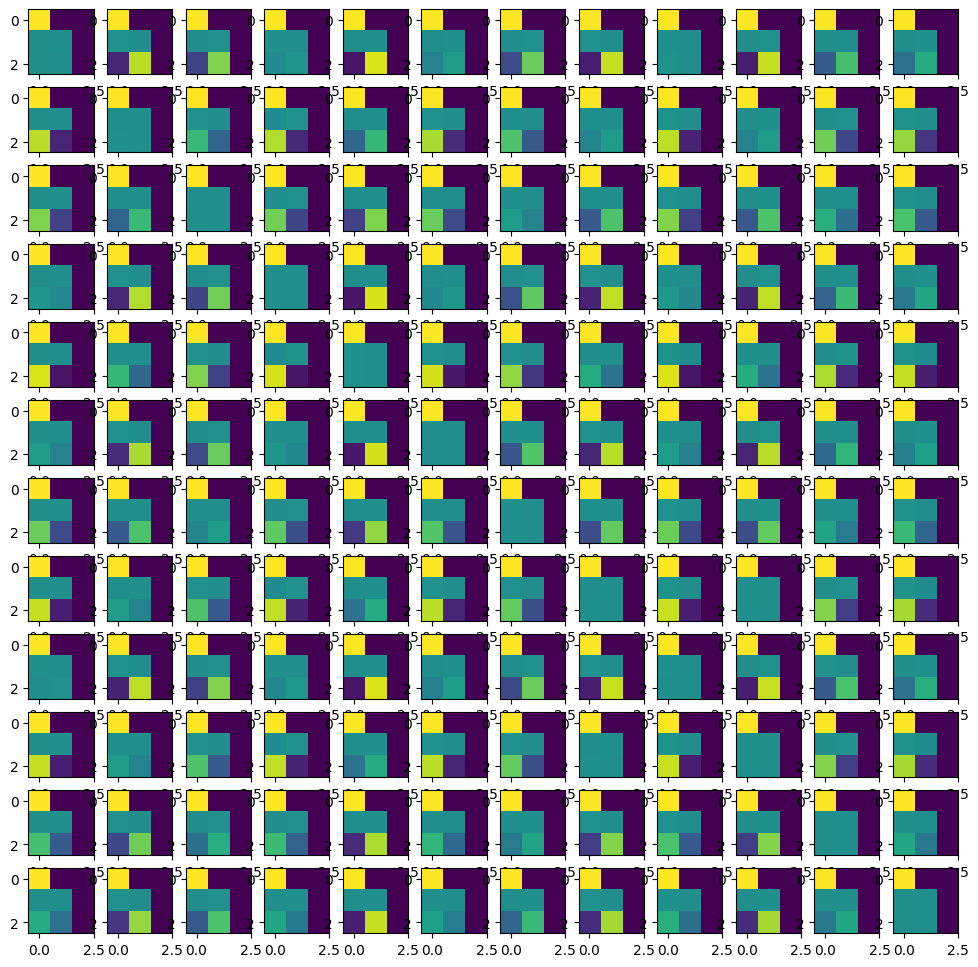

In [24]:
head=1
fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,i*12+j+1)
        plt.imshow(attn_mat_sq[i, j, head, :, :].detach().cpu().numpy())

Ok so looks like Neel is just taking the lower left corner -> i think I follow why. 

In [25]:
attn_mat_sq.shape

torch.Size([113, 113, 4, 3, 3])

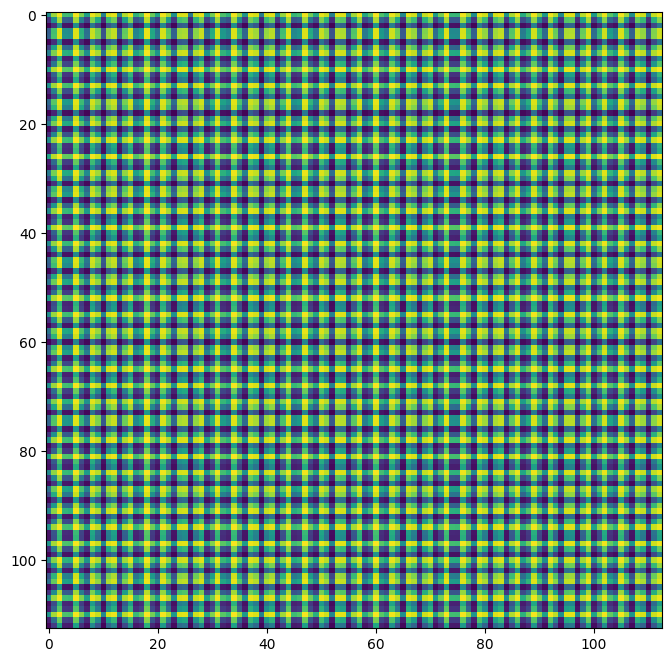

In [29]:
head=0
fig=plt.figure(0, (8,8))
plt.imshow(attn_mat_sq[:,:,head, 2, 0].detach().cpu().numpy()) #So sure lots of structure here. 

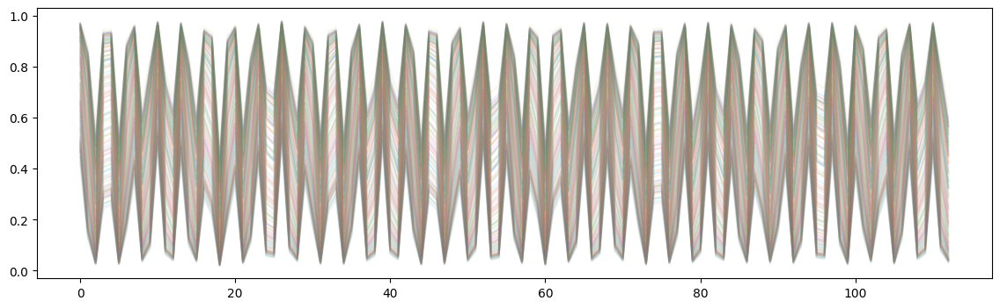

In [35]:
fig=plt.figure(0, (14, 4))
plt.plot(attn_mat_sq[:,:,head, 2, 0].detach().cpu().numpy(), alpha=0.1);

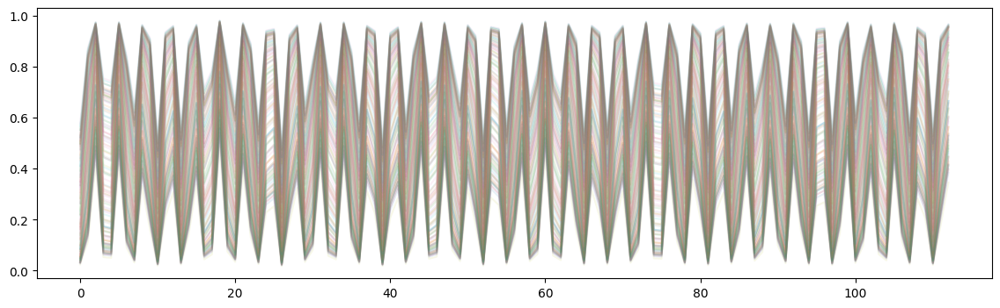

In [36]:
fig=plt.figure(0, (14, 4))
plt.plot(attn_mat_sq[:,:,head, 2, 0].detach().cpu().numpy().T, alpha=0.1);

Ok how yeah that's a lot of structure!

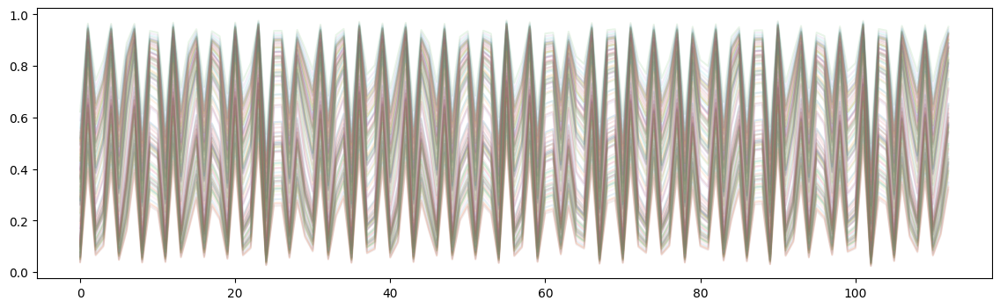

In [38]:
head=3
fig=plt.figure(0, (14, 4))
plt.plot(attn_mat_sq[:,:,head, 2, 0].detach().cpu().numpy().T, alpha=0.1);

In [45]:
neuron_acts_post_sq = einops.rearrange(neuron_acts_post, "(x y) d_mlp -> x y d_mlp", x=p)
neuron_acts_pre_sq = einops.rearrange(neuron_acts_pre, "(x y) d_mlp -> x y d_mlp", x=p)

In [46]:
neuron_acts_post_sq.shape

torch.Size([113, 113, 512])

In [62]:
def viz_neuron_pre(neuron_index=0):
    plt.imshow(neuron_acts_pre_sq[:,:,neuron_index].detach().cpu().numpy())

In [63]:
interact(viz_neuron_pre, neuron_index=(0, 512, 1))

interactive(children=(IntSlider(value=0, description='neuron_index', max=512), Output()), _dom_classes=('widge…

<function __main__.viz_neuron_pre(neuron_index=0)>

In [50]:
def viz_neuron_post(neuron_index=0):
    plt.imshow(neuron_acts_post_sq[:,:,neuron_index].detach().cpu().numpy())

In [52]:
interact(viz_neuron_post, neuron_index=(0, 512, 1))

interactive(children=(IntSlider(value=0, description='neuron_index', max=512), Output()), _dom_classes=('widge…

<function __main__.viz_neuron_post(neuron_index=0)>

Ok wow these have cool structure! These would be fun to viz during training

In [64]:
def make_fourier_basis(p: int) -> tuple[Tensor, list[str]]:
    """
    Returns a pair `fourier_basis, fourier_basis_names`, where `fourier_basis` is
    a `(p, p)` tensor whose rows are Fourier components and `fourier_basis_names`
    is a list of length `p` containing the names of the Fourier components (e.g.
    `["const", "cos 1", "sin 1", ...]`). You may assume that `p` is odd.
    """
    # Define a grid for the Fourier basis vecs (we'll normalize them all at the end)
    # Note, the first vector is just the constant wave
    fourier_basis = t.ones(p, p)
    fourier_basis_names = ["Const"]
    for i in range(1, p // 2 + 1):
        # Define each of the cos and sin terms
        fourier_basis[2 * i - 1] = t.cos(2 * t.pi * t.arange(p) * i / p)
        fourier_basis[2 * i] = t.sin(2 * t.pi * t.arange(p) * i / p)
        fourier_basis_names.extend([f"cos {i}", f"sin {i}"])
    # Normalize vectors, and return them
    fourier_basis /= fourier_basis.norm(dim=1, keepdim=True)
    return fourier_basis.to(device), fourier_basis_names
    
fourier_basis, fourier_basis_names = make_fourier_basis(p)


def fft1d(x: Tensor) -> Tensor:
    """
    Returns the 1D Fourier transform of `x`, which can be a vector or a batch of vectors.

    x.shape = (..., p)
    """
    return x @ fourier_basis.T

def fourier_2d_basis_term(i: int, j: int) -> Float[Tensor, "p p"]:
    """
    Returns the 2D Fourier basis term corresponding to the outer product of the `i`-th component of
    the 1D Fourier basis in the `x` direction and the `j`-th component of the 1D Fourier basis in
    the `y` direction.

    Returns a 2D tensor of length `(p, p)`.
    """
    return fourier_basis[i][:, None] * fourier_basis[j][None, :]


def fft2d(tensor: Tensor) -> Tensor:
    """
    Retuns the components of `tensor` in the 2D Fourier basis.

    Asumes that the input has shape `(p, p, ...)`, where the
    last dimensions (if present) are the batch dims.
    Output has the same shape as the input.
    """
    # fourier_basis[i] is the i-th basis vector, which we want to multiply along
    return einops.einsum(tensor, fourier_basis, fourier_basis, "px py ..., i px, j py -> i j ...")


In [67]:
neuron_acts_post_fourier_basis = fft2d(neuron_acts_post_sq)
neuron_acts_pre_fourier_basis = fft2d(neuron_acts_pre_sq)

In [68]:
neuron_acts_post_fourier_basis.shape

torch.Size([113, 113, 512])

In [69]:
def viz_neuron_pre_ft(neuron_index=0):
    plt.imshow(neuron_acts_pre_fourier_basis[:,:,neuron_index].detach().cpu().numpy())

In [70]:
interact(viz_neuron_pre_ft, neuron_index=(0, 512, 1))

interactive(children=(IntSlider(value=0, description='neuron_index', max=512), Output()), _dom_classes=('widge…

<function __main__.viz_neuron_pre_ft(neuron_index=0)>

In [56]:
def viz_neuron_post_ft(neuron_index=0):
    plt.imshow(neuron_acts_post_fourier_basis[:,:,neuron_index].detach().cpu().numpy())

In [58]:
interact(viz_neuron_post_ft, neuron_index=(0, 512, 1))

interactive(children=(IntSlider(value=0, description='neuron_index', max=512), Output()), _dom_classes=('widge…

<function __main__.viz_neuron_post_ft(neuron_index=0)>

- Ok trying to get my head around this!
- Can i make a circular plot here somehow?
- Some type of argument is forming -> it's like let's take a certain neuron, and explore it's output as x and y change. 

In [59]:
neuron_acts_post_sq.shape

torch.Size([113, 113, 512])

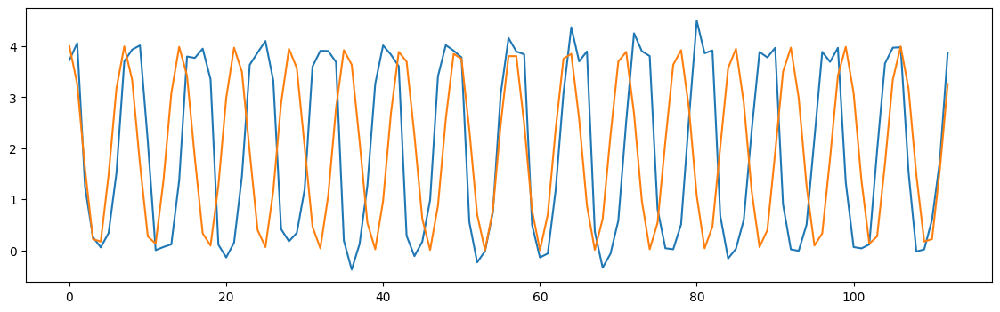

In [83]:
fig=plt.figure(0, (14,4))
neuron_idx=1
plt.plot(neuron_acts_pre_sq[0, :, neuron_idx].detach().cpu().numpy())
xs=np.arange(p)
plt.plot(xs, 2*np.cos(xs*16*np.pi*2/113)+2)

- Hm ok so showing the actual decomposition from the FFT could be interesting here
- This make sense though...I think i understand...let me try something here...

In [84]:
neuron_acts_pre_sq.shape

torch.Size([113, 113, 512])

In [86]:
neuron_acts_pre.shape

torch.Size([12769, 512])

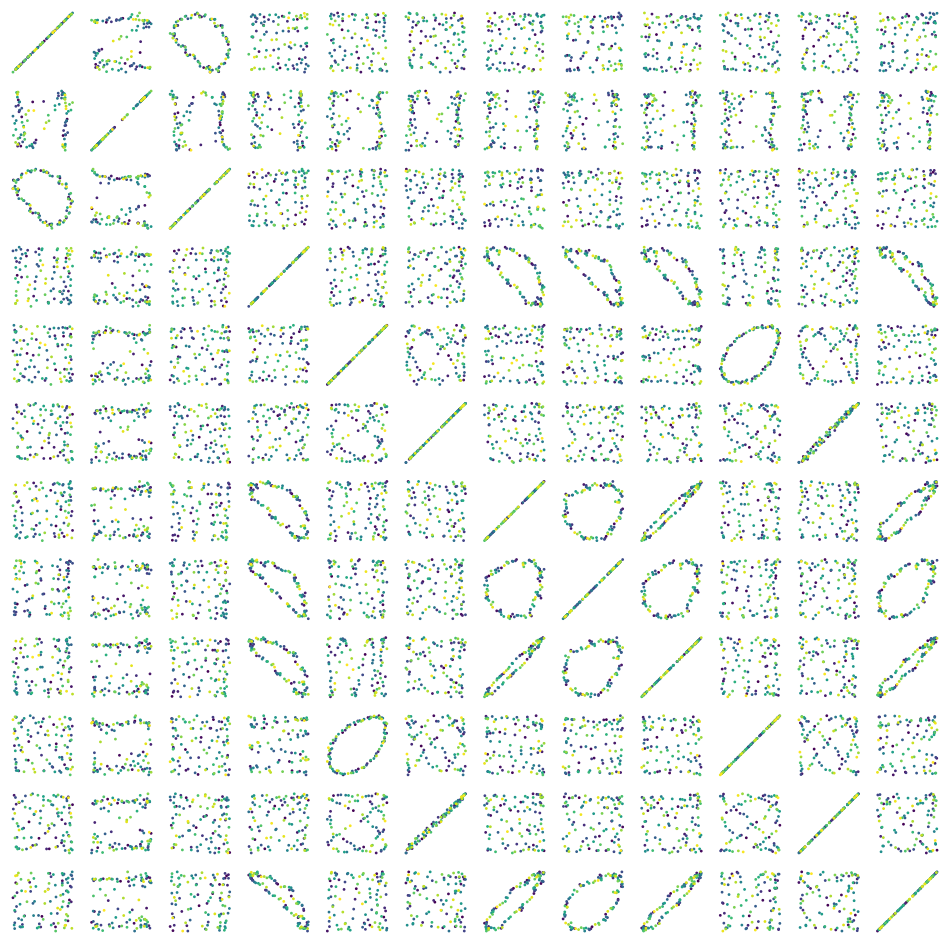

In [98]:
fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(neuron_acts_pre[:100, i].detach().cpu().numpy(), neuron_acts_pre[:100, j].detach().cpu().numpy(), c=range(100), s=1)
        plt.axis('off')

- Ok that's pretty cool!
- Would love to see some subset of these during training! Smooth evolution or do they jump when grokking?

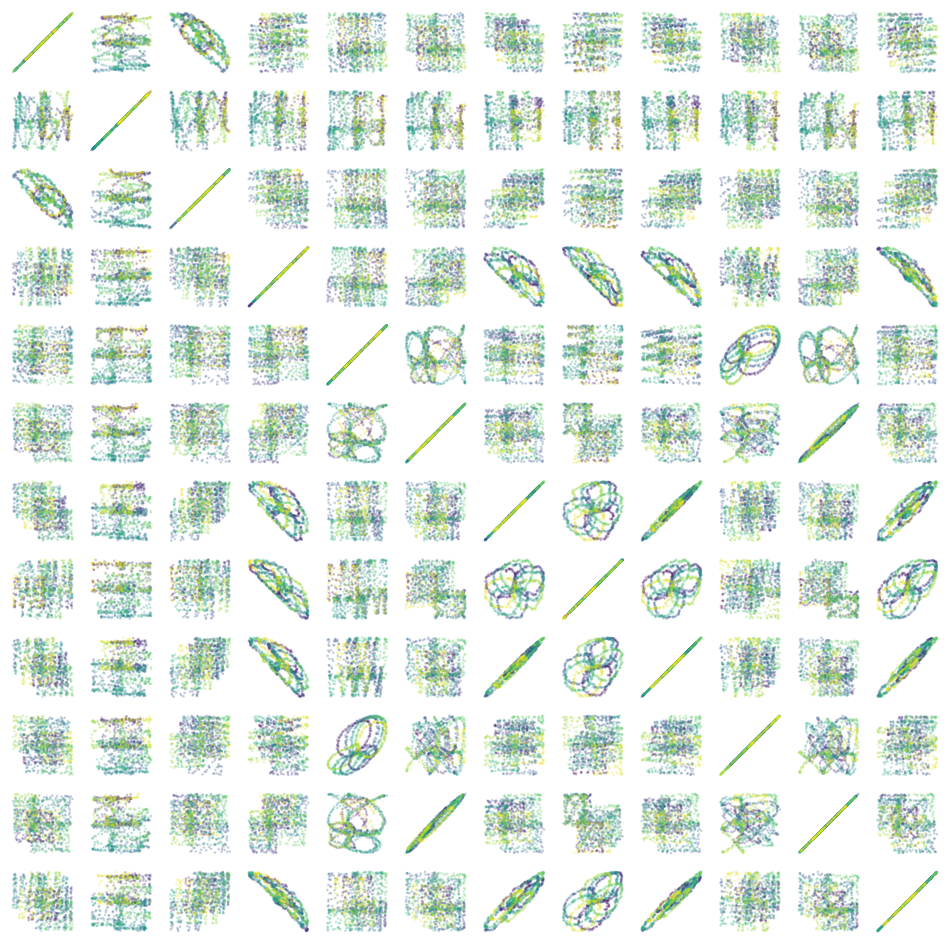

In [93]:
fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(neuron_acts_pre[:1000, i].detach().cpu().numpy(), neuron_acts_pre[:1000, j].detach().cpu().numpy(), c=range(1000), s=1, alpha=0.2)
        plt.axis('off')

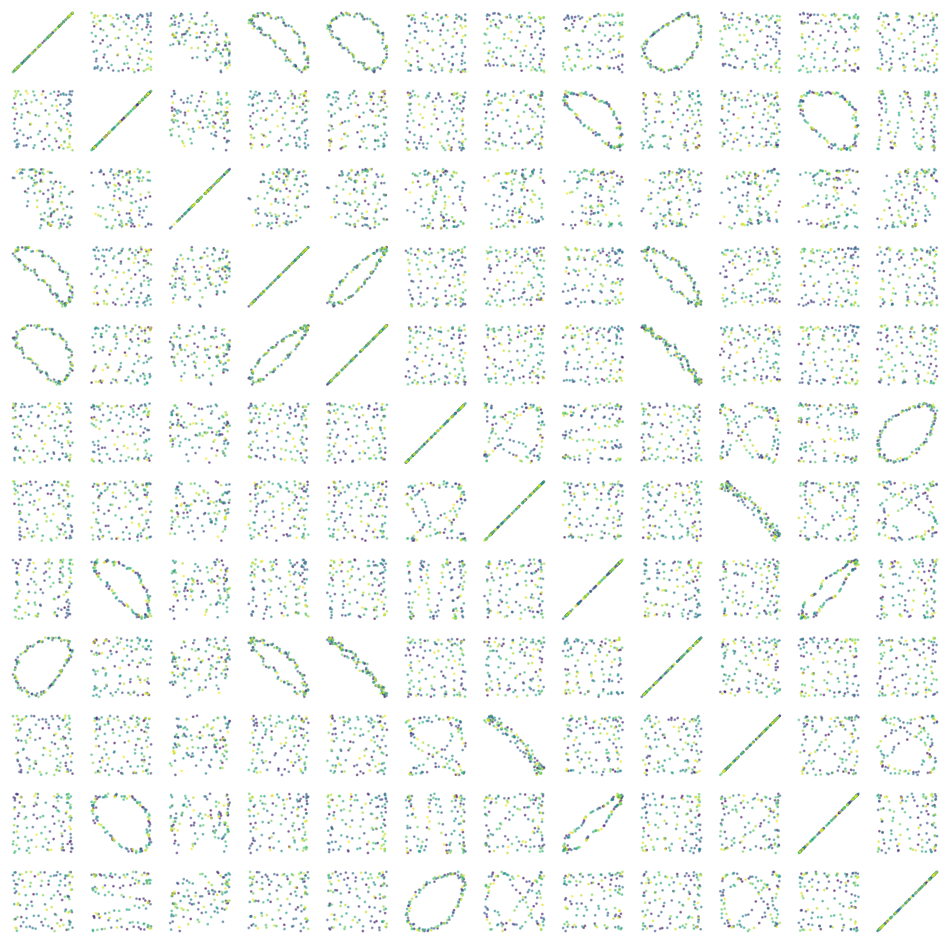

In [95]:
fig=plt.figure(0, (12,12))
offset=12
num_test_pts=p
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(neuron_acts_pre[:num_test_pts, i+offset].detach().cpu().numpy(), 
                    neuron_acts_pre[:num_test_pts, j+offset].detach().cpu().numpy(), 
                    c=range(num_test_pts), s=1, alpha=0.5)
        plt.axis('off')

Man how cool would noodling around the ful 512x512 one in manim be

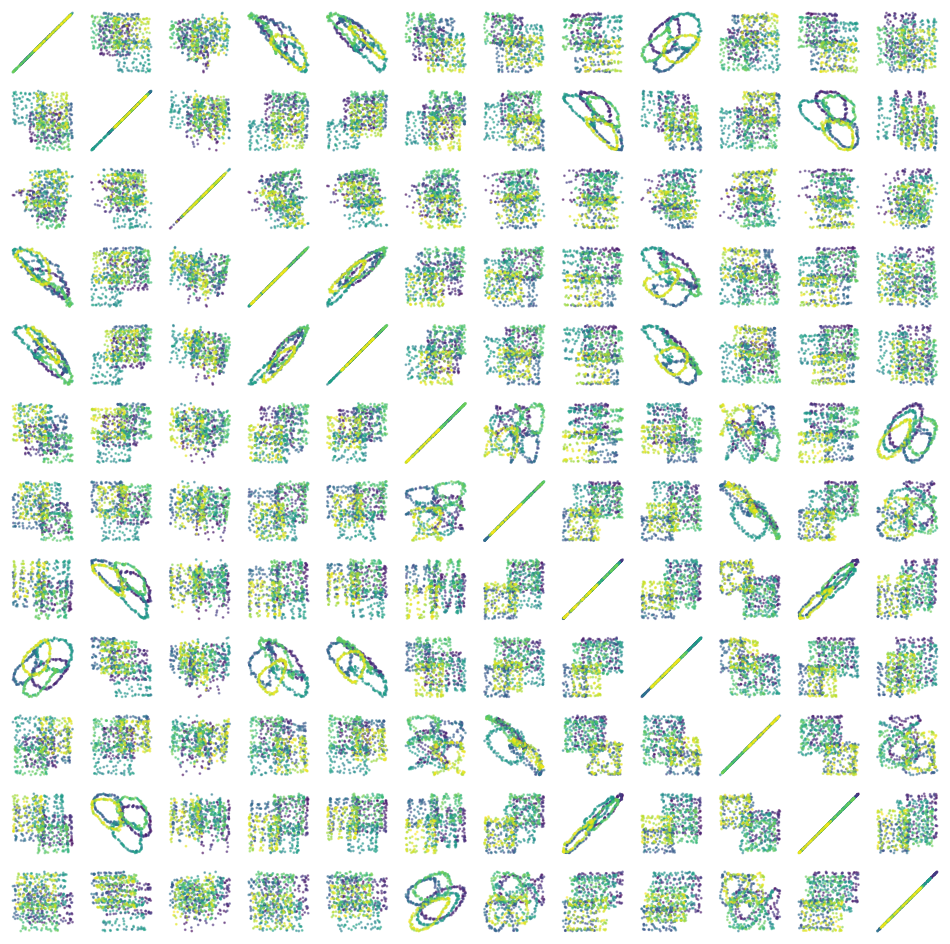

In [96]:
fig=plt.figure(0, (12,12))
offset=12
num_test_pts=p*5
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(neuron_acts_pre[:num_test_pts, i+offset].detach().cpu().numpy(), 
                    neuron_acts_pre[:num_test_pts, j+offset].detach().cpu().numpy(), 
                    c=range(num_test_pts), s=1, alpha=0.5)
        plt.axis('off')

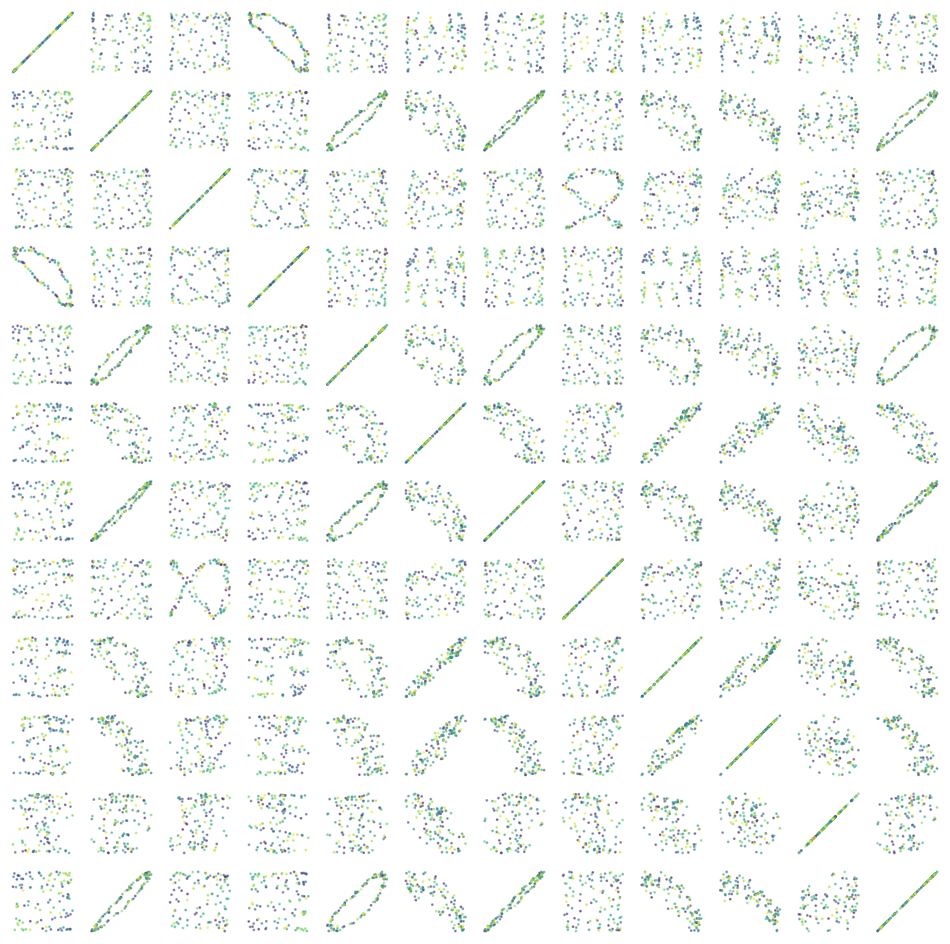

In [97]:
fig=plt.figure(0, (12,12))
offset=100
num_test_pts=p
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(neuron_acts_pre[:num_test_pts, i+offset].detach().cpu().numpy(), 
                    neuron_acts_pre[:num_test_pts, j+offset].detach().cpu().numpy(), 
                    c=range(num_test_pts), s=1, alpha=0.5)
        plt.axis('off')

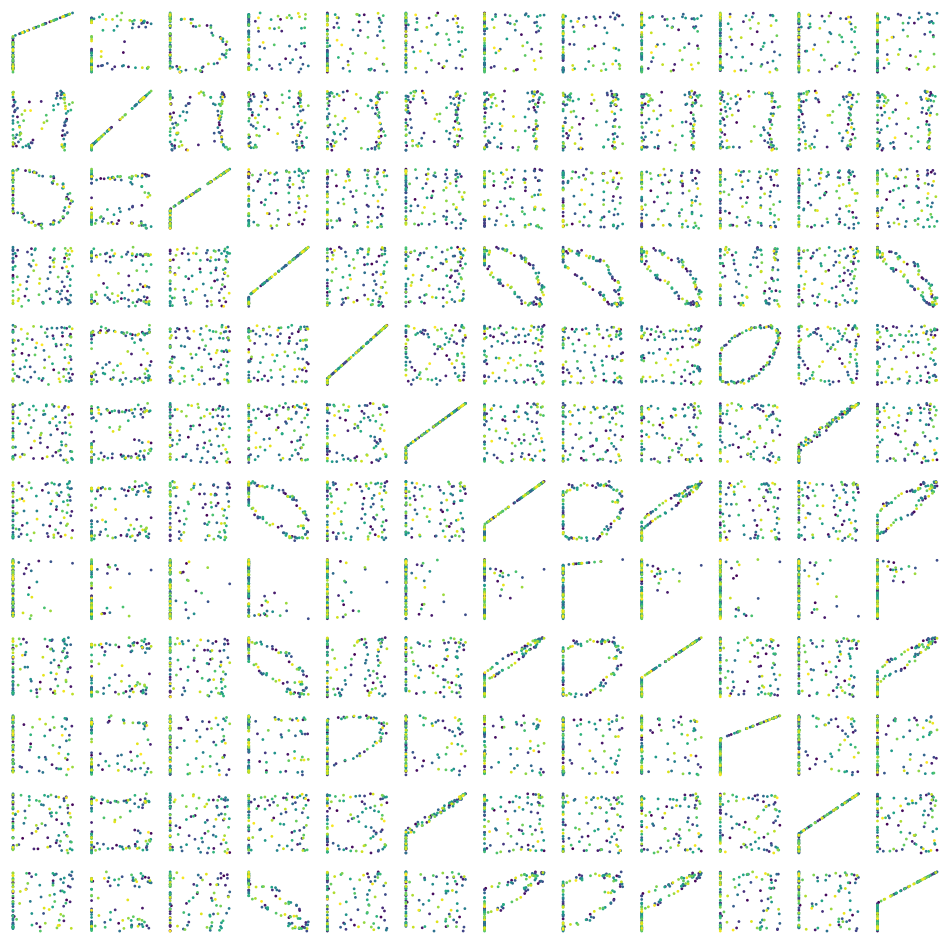

In [101]:
fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(neuron_acts_post[:100, i].detach().cpu().numpy(), neuron_acts_pre[:100, j].detach().cpu().numpy(), c=range(100), s=1)
        plt.axis('off')

- Questions from here:
- Certainly -> how does the attention and first half of the MLP compute these guys?
- But also maybe like -> is it valid/interesting to do a similar viz earlier in the pipeline?
- Maybe even like as we go through the residual stream?

In [103]:
for k in cache: 
    print(k, cache[k].shape)

hook_embed torch.Size([12769, 3, 128])
hook_pos_embed torch.Size([12769, 3, 128])
blocks.0.hook_resid_pre torch.Size([12769, 3, 128])
blocks.0.attn.hook_q torch.Size([12769, 3, 4, 32])
blocks.0.attn.hook_k torch.Size([12769, 3, 4, 32])
blocks.0.attn.hook_v torch.Size([12769, 3, 4, 32])
blocks.0.attn.hook_attn_scores torch.Size([12769, 4, 3, 3])
blocks.0.attn.hook_pattern torch.Size([12769, 4, 3, 3])
blocks.0.attn.hook_z torch.Size([12769, 3, 4, 32])
blocks.0.hook_attn_out torch.Size([12769, 3, 128])
blocks.0.hook_resid_mid torch.Size([12769, 3, 128])
blocks.0.mlp.hook_pre torch.Size([12769, 3, 512])
blocks.0.mlp.hook_post torch.Size([12769, 3, 512])
blocks.0.hook_mlp_out torch.Size([12769, 3, 128])
blocks.0.hook_resid_post torch.Size([12769, 3, 128])


In [107]:
# hook_embed_sq = einops.rearrange(cache['hook_embed'], "(x y) ... -> x y ...", x=p)

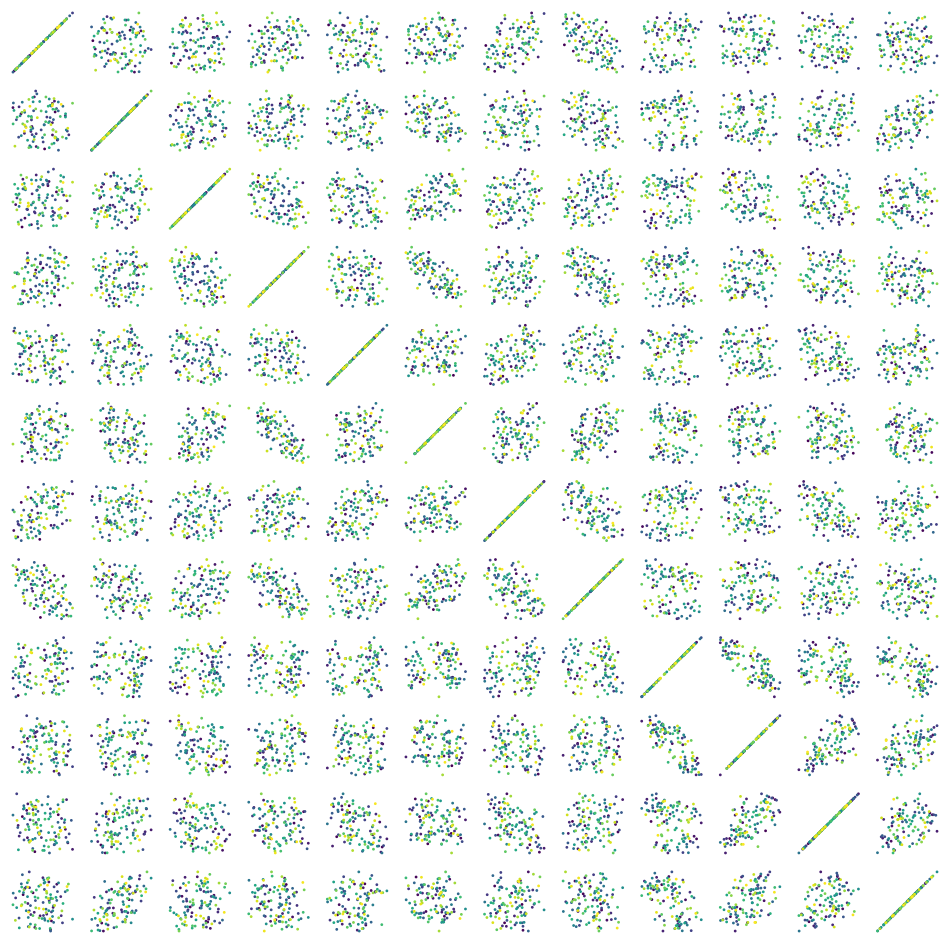

In [109]:
offset=0
num_test_pts=p
k='hook_embed'

fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(cache[k][:num_test_pts, 1, i+offset].detach().cpu().numpy(), 
                    cache[k][:num_test_pts, 1, j+offset].detach().cpu().numpy(), 
                    c=range(num_test_pts), s=1)
        plt.axis('off')

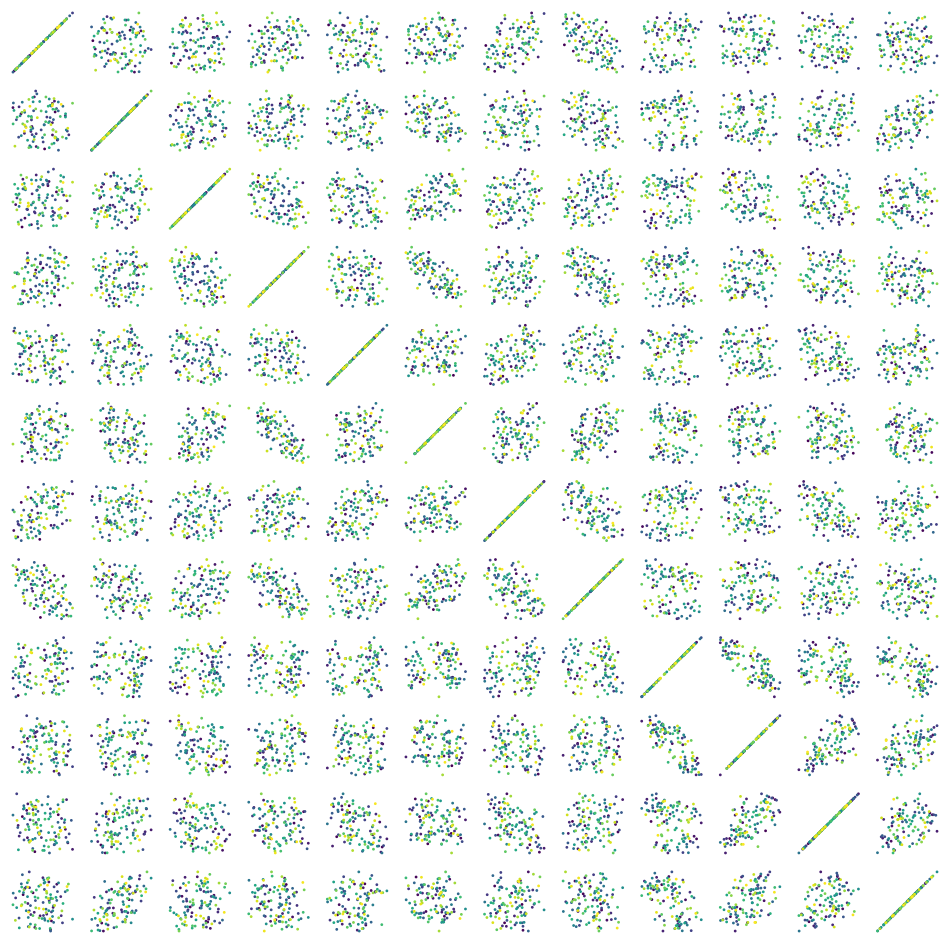

In [112]:
offset=0
num_test_pts=p
k='hook_embed'

fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(cache[k][:num_test_pts, 1, i+offset].detach().cpu().numpy(), 
                    cache[k][:num_test_pts, 1, j+offset].detach().cpu().numpy(), 
                    c=range(num_test_pts), s=1)
        plt.axis('off')

In [113]:
for k in cache: 
    print(k, cache[k].shape)

hook_embed torch.Size([12769, 3, 128])
hook_pos_embed torch.Size([12769, 3, 128])
blocks.0.hook_resid_pre torch.Size([12769, 3, 128])
blocks.0.attn.hook_q torch.Size([12769, 3, 4, 32])
blocks.0.attn.hook_k torch.Size([12769, 3, 4, 32])
blocks.0.attn.hook_v torch.Size([12769, 3, 4, 32])
blocks.0.attn.hook_attn_scores torch.Size([12769, 4, 3, 3])
blocks.0.attn.hook_pattern torch.Size([12769, 4, 3, 3])
blocks.0.attn.hook_z torch.Size([12769, 3, 4, 32])
blocks.0.hook_attn_out torch.Size([12769, 3, 128])
blocks.0.hook_resid_mid torch.Size([12769, 3, 128])
blocks.0.mlp.hook_pre torch.Size([12769, 3, 512])
blocks.0.mlp.hook_post torch.Size([12769, 3, 512])
blocks.0.hook_mlp_out torch.Size([12769, 3, 128])
blocks.0.hook_resid_post torch.Size([12769, 3, 128])


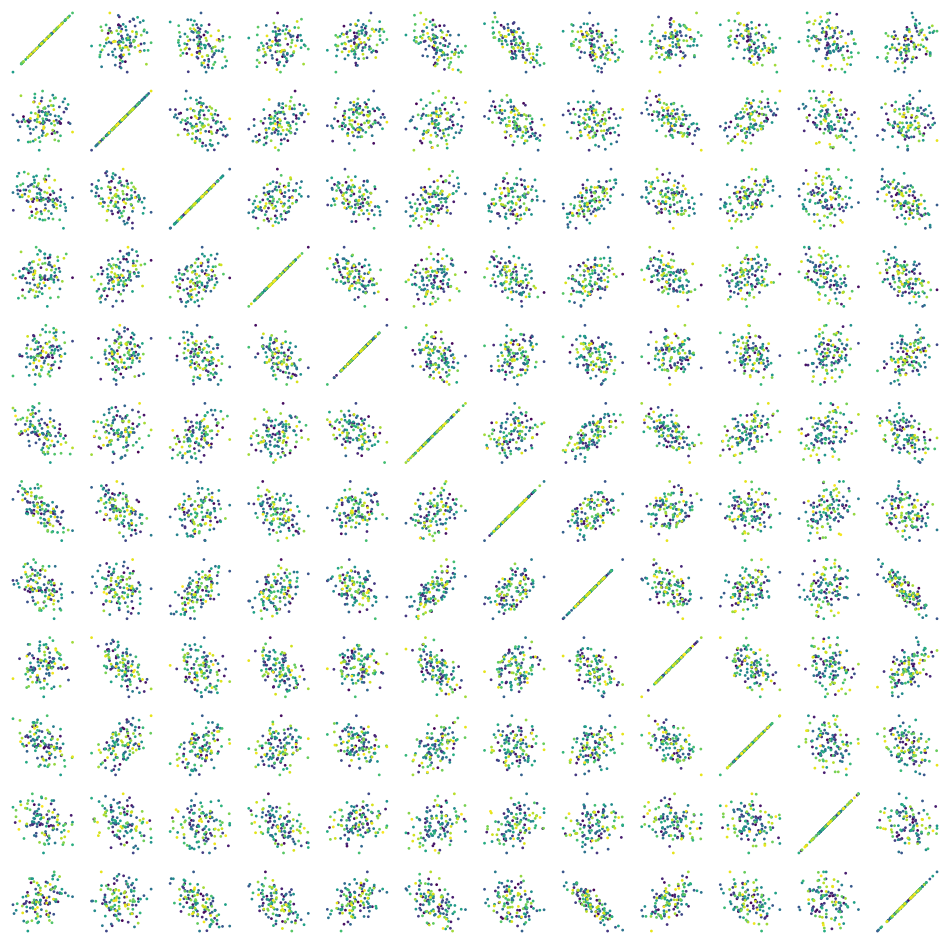

In [116]:
offset=0
num_test_pts=p
k='blocks.0.hook_resid_post'

fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(cache[k][:num_test_pts, 2, i+offset].detach().cpu().numpy(), 
                    cache[k][:num_test_pts, 2, j+offset].detach().cpu().numpy(), 
                    c=range(num_test_pts), s=1)
        plt.axis('off')

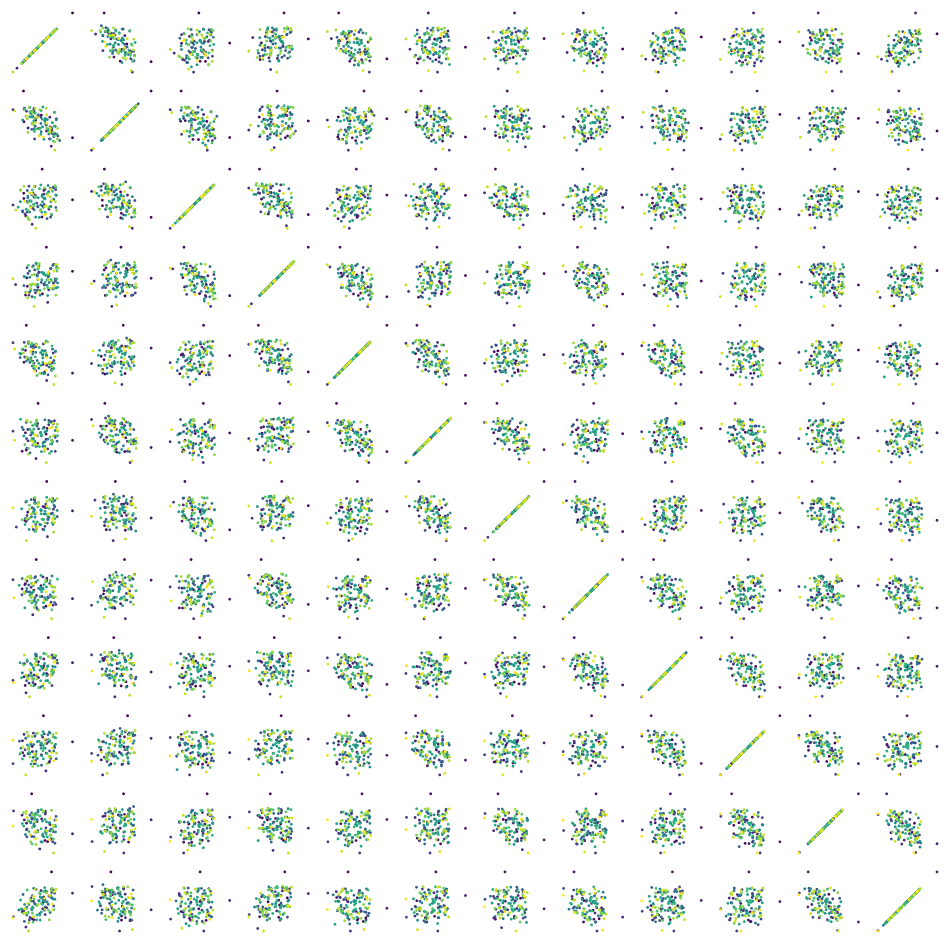

In [122]:
offset=0
num_test_pts=p
k='blocks.0.hook_resid_post'

with t.no_grad():
    u=model.unembed(cache[k])

fig=plt.figure(0, (12,12))
for i in range(12):
    for j in range(12):
        fig.add_subplot(12,12,12*i+j+1)
        plt.scatter(u[:num_test_pts, 2, i+offset].detach().cpu().numpy(), 
                    u[:num_test_pts, 2, j+offset].detach().cpu().numpy(), 
                    c=range(num_test_pts), s=1)
        plt.axis('off')

- Ok just noodling here -> missing some little piece for this kinda thing to make sense/not
- Ok so I'm somewhat cool with the middle of the MLP is representing/learning
- Obvious questions from here I think are ->

1. How does the attention layer and first half of the MLP compute this representation? 
2. How does this representation get turned into a final answer by the end of the MLP and unembedding?

HOWEVER. My intuition right now says I should go for a little walk or something, then actually: 1. get a final quesiton list for neel 2. Go write! It's unclear where I'll want ot go into depth just yet -> migth be a waste of time to answer the questions above right now. Writing should help me shake out what's important. 